In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython

sc._settings.settings._vector_friendly=True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sc.settings.figdir='/home/matthew.schmitz/figures/silett/'

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import sys
import antipode
from antipode.antipode_model import *
import antipode.model_functions
from antipode.model_functions import *
import antipode.model_distributions
from antipode.model_distributions import *
import antipode.model_modules
from antipode.model_modules import *
import antipode.train_utils
from antipode.train_utils import *
import antipode.plotting
from antipode.plotting import *


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is not available


In [2]:
import importlib
antipode.plotting=importlib.reload(antipode.plotting)

In [3]:
antipode_model=antipode.antipode_model.ANTIPODE.load('/home/matthew.schmitz/Matthew/models/1.9.1.8.3_SilettiNoPsi/',prefix='p3_',device=device)#adata=adata
adata=antipode_model.adata_manager.adata

In [109]:
adata.layers['norm_UMIs']=adata.layers['UMIs'].copy()
adata.layers['norm_UMIs']=scipy.sparse.csr_matrix(1e4*(adata.layers['norm_UMIs']/adata.layers['norm_UMIs'].sum(1)))

In [4]:
#For PyComplexHeatmap need to register palettes
gs1=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102,name='godsnot_102')
matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
gs2=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102,name='godsnot_big')
matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)


/scratch/fast/16080181/ipykernel_415/2840506100.py:3: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
/scratch/fast/16080181/ipykernel_415/2840506100.py:5: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)


KeyError: 'species_color_dict'

In [5]:
batch_key='sample_id'
discov_key='donor_id'
layer_key='UMIs'
MDE_KEY = "X_antipode_MDE"

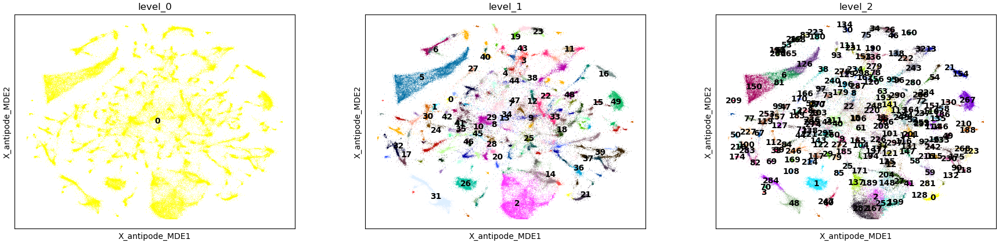

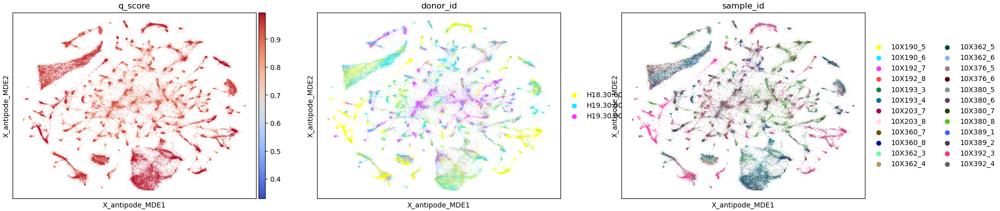

In [7]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_antipode_clusters.svg'
)


sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score',discov_key,batch_key],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)


In [10]:
sc.tl.dendrogram(adata,groupby='level_2',use_rep='X_antipode')

In [50]:
pstore=adata.uns['param_store']
n_clusters=antipode_model.level_sizes[-1]
prefix=''
level_edges=[numpy_hardmax(antipode_model.adata_manager.adata.uns[prefix+'param_store']['edges_'+str(i)],axis=-1) for i in range(len(antipode_model.level_sizes)-1)]
levels=antipode_model.tree_convergence_bottom_up.just_propagate(np.eye(antipode_model.level_sizes[-1]),level_edges)
prop_taxon=np.concatenate(levels,axis=-1)
prop_locs=numpy_relu(prop_taxon@pstore['locs'])#numpy_relu
prop_cluster_intercept=prop_taxon@pstore['cluster_intercept']
cluster_params=(prop_locs@pstore['z_decoder_weight'])+prop_cluster_intercept

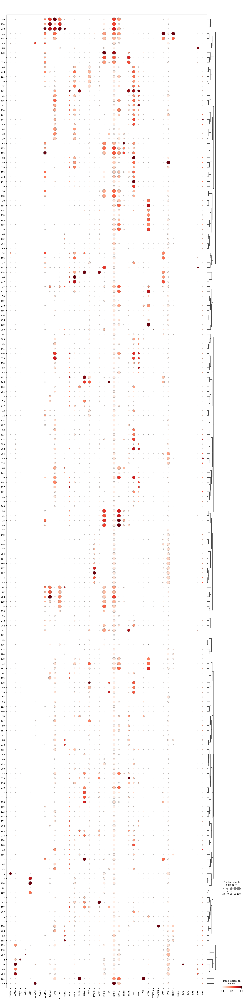

In [12]:
gene_list=['RBFOX3','PDGFRA','AQP4','FOXJ1','AIF1','MOG','COL1A2','CD34','COL4A1','FOXG1','SATB2','RORB','SLC17A7','TLE4','FEZF2',
           'DLX2','PROX1','SCGN','NKX2-1','LHX6','SST','PVALB','CRABP1','MEIS2','TSHZ1','NPY','FOXP1','FOXP2','PDYN','PENK','ISL1',
           'MKI67','HMX3','TH','LMX1A','TFAP2A','TFAP2B','RSPO1','NKX3-1','IGF1','ITPR2','OTX2','HOXB3','PAX1','PAX2','PAX3','PAX5','PAX6','PAX7','PAX8']
gene_list=[x for x in gene_list if x in adata.var.index]
"""
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=gene_list,cmap='Purples',
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=6,
    legend_loc='on data',use_raw=False
)
"""
sc.pl.dotplot(adata,var_names=gene_list,groupby='level_2',standard_scale='var',dendrogram=True)


<Axes: ylabel='Count'>

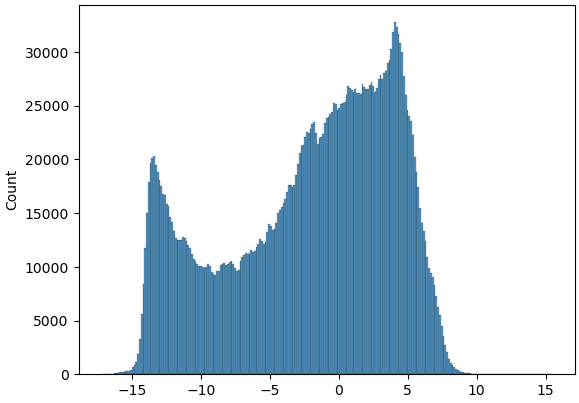

In [13]:
seaborn.histplot(cluster_params.flatten())

### Specific markers

cluster - max

In [15]:
discov_labels=adata.obs['donor_id'].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
cluster_index=sorted(adata.obs['level_2'].astype(int).unique())#list(range(antipode_model.level_sizes[-1]))#list(range(pstore['locs'].shape[0]))
cluster_labels=[str(x) for x in cluster_index]#adapt
cluster_label_dict=dict(zip(cluster_index,cluster_labels))
var_labels=adata.var.index

In [16]:
coefs=[]
for i in tqdm.tqdm(range(cluster_params.shape[0]-n_clusters,cluster_params.shape[0])):
    others=list(set(list(range(cluster_params.shape[0])))-set([i]))
    coefs.append((cluster_params[i:(i+1),:]-cluster_params[others,:].max(0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)
coefs=coefs[cluster_index,:]
cdf=pd.DataFrame(coefs.T,index=adata.var.index,columns=cluster_labels)
marker_gene_order=cdf.idxmax(0)[adata.uns['dendrogram_level_2']['categories_ordered']].unique()

100%|██████████| 300/300 [00:02<00:00, 142.35it/s]


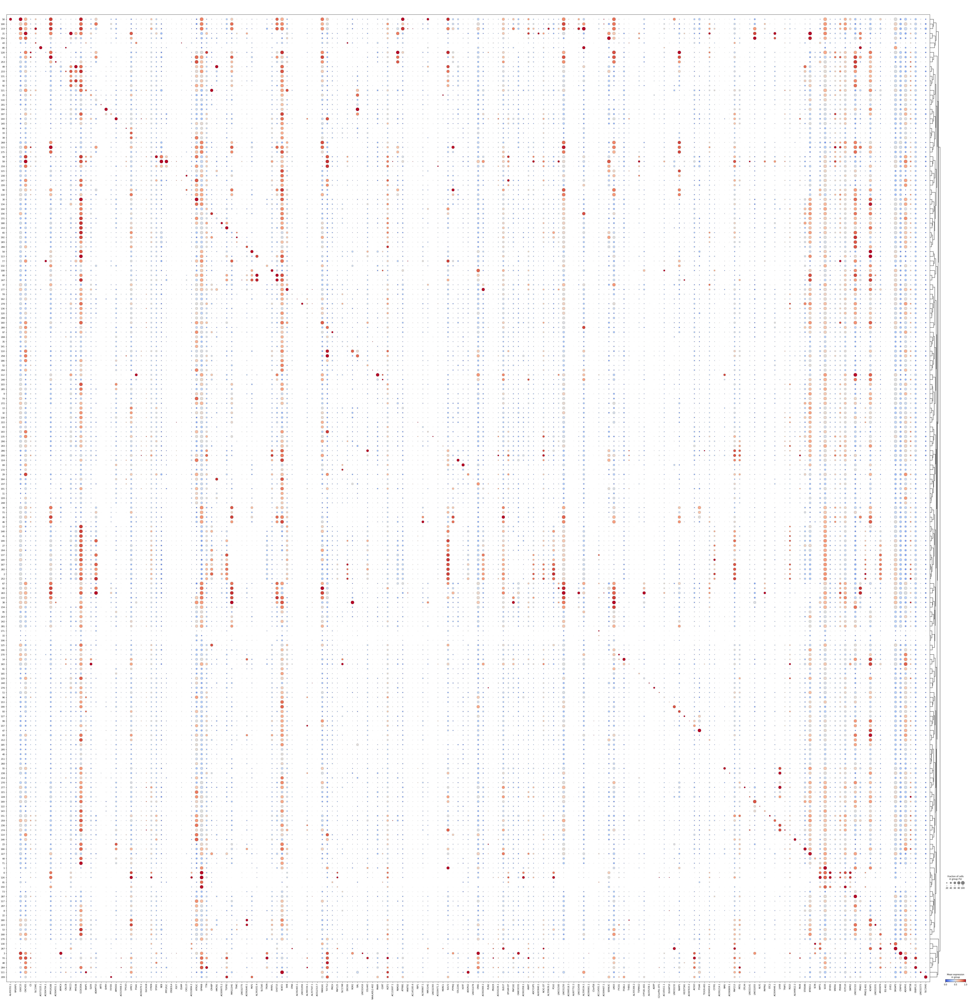

In [17]:
sc.pl.dotplot(adata,groupby='level_2',var_names=marker_gene_order,dendrogram='dendrogram_level_2',standard_scale='var',use_raw=False,cmap='coolwarm')

### Robust Markers

cluster - mean

In [18]:
coefs=[]
for i in tqdm.tqdm(range(cluster_params.shape[0]-n_clusters,cluster_params.shape[0])):
    others=list(set(list(range(cluster_params.shape[0])))-set([i]))
    coefs.append((cluster_params[i:(i+1),:]-cluster_params[others,:].mean(0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)
coefs=coefs[cluster_index,:]
cdf=pd.DataFrame(coefs.T,index=adata.var.index,columns=cluster_labels)
marker_gene_order=cdf.idxmax(0)[adata.uns['dendrogram_level_2']['categories_ordered']].unique()

100%|██████████| 300/300 [00:02<00:00, 143.67it/s]


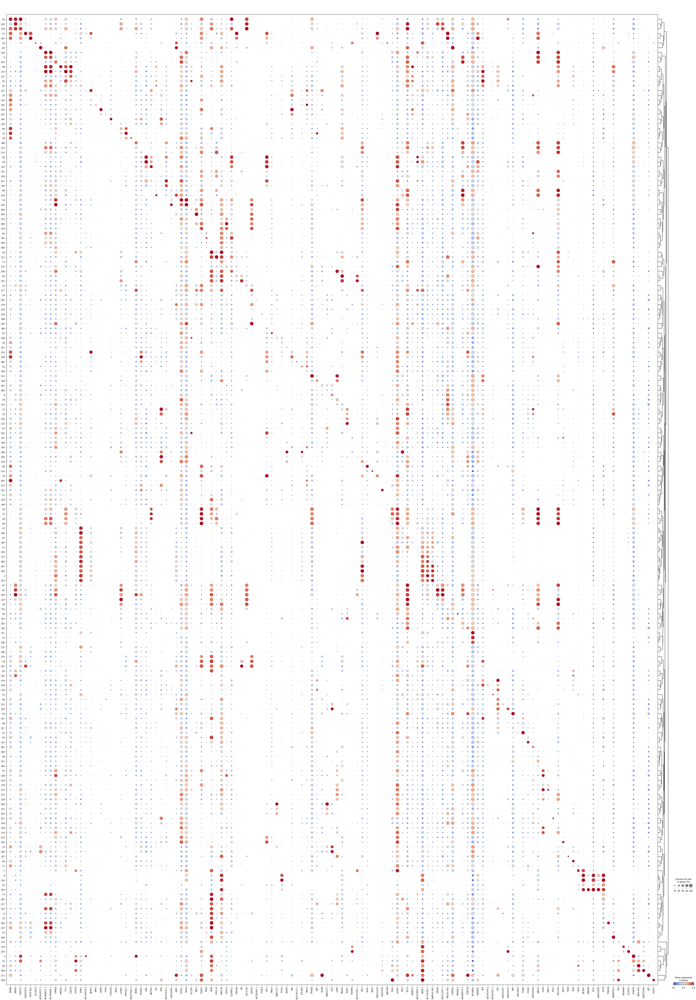

In [19]:
sc.pl.dotplot(adata,groupby='level_2',var_names=marker_gene_order,dendrogram='dendrogram_level_2',standard_scale='var',use_raw=False,cmap='coolwarm')

In [20]:
"""In addition, along the latent edge of the heatmap, add a latent x latent self correlation matrix (set the diagonal to 0), then calculate along the y axis additional annotations for enrichments of """

'In addition, along the latent edge of the heatmap, add a latent x latent self correlation matrix (set the diagonal to 0), then calculate along the y axis additional annotations for enrichments of '

In [22]:
import matplotlib.font_manager
print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))
matplotlib.font_manager.font_family_aliases

['/usr/share/fonts/dejavu/DejaVuSansMono-Bold.ttf', '/usr/share/fonts/urw-base35/NimbusRoman-BoldItalic.otf', '/usr/share/fonts/urw-base35/P052-Roman.otf', '/usr/share/fonts/dejavu/DejaVuSans.ttf', '/usr/share/fonts/dejavu/DejaVuSansCondensed.ttf', '/usr/share/fonts/dejavu/DejaVuSansMono-BoldOblique.ttf', '/usr/share/fonts/urw-base35/NimbusMonoPS-Regular.otf', '/usr/share/fonts/urw-base35/NimbusSans-Italic.otf', '/usr/share/fonts/urw-base35/C059-Bold.otf', '/usr/share/fonts/urw-base35/URWGothic-Book.otf', '/usr/share/fonts/dejavu/DejaVuSansCondensed-BoldOblique.ttf', '/usr/share/fonts/urw-base35/P052-Bold.otf', '/usr/share/fonts/urw-base35/URWBookman-LightItalic.otf', '/usr/share/fonts/dejavu/DejaVuSans-BoldOblique.ttf', '/usr/share/fonts/urw-base35/P052-Italic.otf', '/usr/share/fonts/urw-base35/NimbusRoman-Italic.otf', '/usr/share/fonts/urw-base35/NimbusSans-Bold.otf', '/usr/share/fonts/urw-base35/NimbusMonoPS-BoldItalic.otf', '/usr/share/fonts/urw-base35/NimbusSans-Regular.otf', '/us

{'cursive',
 'fantasy',
 'monospace',
 'sans',
 'sans serif',
 'sans-serif',
 'serif'}

In [23]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif']='DejaVuSansMono'
plt.rcParams['pdf.fonttype']=42


In [24]:
dc_df=pd.DataFrame(pstore['discov_dc'].var(2).T,index=latent_labels,columns=discov_labels)
dm_df=pd.DataFrame(pstore['discov_dm'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
dmt_df=pd.DataFrame((pstore['discov_dm'][:,cluster_index,:].var(1)).T,index=latent_labels,columns=discov_labels)
di_df=pd.DataFrame(pstore['discov_di'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)

In [51]:
loc_df=pd.DataFrame(prop_locs[cluster_index,:],index=cluster_labels,columns=latent_labels)
loc_df=loc_df+(np.random.standard_normal(loc_df.shape)*1e-10)
loc_df.index.name='level_2'

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.T.abs(),method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

In [53]:
adata.obs['n_genes']=adata.layers['UMIs'].sum(-1)

In [54]:
cluster_anno_df=pd.DataFrame([pstore['edges_1'].argmax(-1)[cluster_index].astype(str)]).T
cluster_anno_df.columns=['level_1']
cluster_anno_df.index=cluster_labels
#cluster_anno_df.index=[str(x) for x in range(cluster_anno_df.shape[0])]
#cluster_anno_df['cell_class']=adata.obs.groupby('level_2')['cell_class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['level_2']=adata.obs['level_2'].cat.categories
cluster_anno_df['q_score']=adata.obs.groupby('level_2')['q_score'].mean()
adata.obs['log_n_genes']=np.log10(adata.obs['n_genes'])
cluster_anno_df['log_n_genes']=adata.obs.groupby('level_2')['log_n_genes'].mean()

left_ha = pch.HeatmapAnnotation(
            #level_2=pch.anno_simple(cluster_anno_df['level_2'], rasterized=False,cmap='godsnot_102',legend=False),
            level_1=pch.anno_simple(cluster_anno_df.level_1, rasterized=False,legend=False,cmap='godsnot_102'),
            q_score=pch.anno_simple(cluster_anno_df.q_score, rasterized=False,legend=False,cmap='coolwarm'),
            log_n_genes=pch.anno_simple(cluster_anno_df.log_n_genes, rasterized=False,legend=False,cmap='coolwarm'),
            axis=0)

In [55]:
cell_cutoff=50
donor_id_binary=adata.obs.groupby('level_2')['donor_id'].value_counts(normalize=False).unstack()>cell_cutoff
zdw_mat=pd.DataFrame(np.absolute(pstore['z_decoder_weight']),index=latent_labels,columns=var_labels).T
donor_id_mat=adata.obs.groupby('level_2')['donor_id'].value_counts(normalize=False).unstack()
donor_id_mat=(donor_id_mat/donor_id_mat.sum(0))

donor_id_ha_dict={}
for col in donor_id_mat.columns:
    donor_id_ha_dict[col]=pch.anno_simple(donor_id_mat[col],cmap='Blues',legend=False)

for col in donor_id_binary.columns:
    donor_id_ha_dict[col+'>'+str(cell_cutoff)]=pch.anno_simple(donor_id_binary[col],cmap='Grays',legend=False)

for col in dm_df.columns:
    donor_id_ha_dict[col+'_DM']=pch.anno_simple(dm_df[col],cmap='Purples',legend=False)

for col in di_df.columns:
    donor_id_ha_dict[col+'_DI']=pch.anno_simple(di_df[col],cmap='Reds',legend=False)

donor_id_ha_dict['label']=pch.anno_label(cluster_anno_df['level_2'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-6.,0.],fontsize=2,arrowprops = dict(visible=False))

right_ha = pch.HeatmapAnnotation(**donor_id_ha_dict,axis=0)


In [30]:
print(gseapy.get_library_name())

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [31]:
div_markers={'G0':list(set([])),#'YWHAG','NNAT'
             'G1':list(set(['CCND1','CCND2','CCND3','CCNE1','CCNE2','MKI67','PCNA'])),
'G1S':list(set(['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7',
      'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'RAD51AP1', 'GMNN', 
      'WDR76', 'SLBP', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 
      'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 
      'E2F8','H4C3','H1-3','H1-5','H2AC12','H2AC20','H1-2','H1-4','H1-1','FBXO5',
      'SPC25','FAM83D','HIST1H1A','HIST1H1B','HIST1H1C','HIST1H1D','HIST1H1E','CCND1','CCND2','CCND3'])),#,'CCNE1', 'CCNE2'
'G2M':list(set(['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 
       'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 
       'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 
       'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 
       'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 
       'GAS2L3', 'CBX5','ASPM','CENPA','CCND1','CCND2','CCND3']))
        }

In [32]:
mf_dict=gseapy.get_library('GO_Molecular_Function_2023')
mf_keys=list(mf_dict.keys())

In [33]:
bp_dict=gseapy.get_library('GO_Biological_Process_2023')
bp_keys=list(bp_dict.keys())


In [ ]:
#print(gseapy.prerank(pd.DataFrame(zdw_mat.var(1)),'GO_Biological_Process_2023',min_size=10,max_size=1000,permutation_num=1000).res2d['Term'])
column_preranks={}
for x in tqdm.tqdm(zdw_mat.columns):
    if not x in column_preranks.keys():
        column_preranks[x]=gseapy.prerank(pd.DataFrame(zdw_mat)[x],'GO_Biological_Process_2023',min_size=10,max_size=500,permutation_num=100).res2d

#print([list(x['Term'][0:10]) for x in column_preranks.values()])

In [ ]:
for k in column_preranks.keys():
    column_preranks[k]['module']=k

column_prerank_mat=pd.concat(column_preranks.values(),axis=0)
prerank_pval_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='FDR q-val').astype(float)
column_prerank_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='NES').astype(float)

In [34]:
chosen_bp=[
'Mitochondrion Distribution (GO:0048311)',
 ]

In [35]:
def select_features_by_pca(A, N,n_components=20):
    # Standardize the data (features as columns)

    pca = sklearn.decomposition.PCA(n_components=n_components)
    S_ = pca.fit_transform(A)  # Reconstruct signals
    A_ = np.abs(pca.components_.T)  # Get the mixing matrix

    # Get the absolute weights and rank features within each component
    component_ranks = np.argsort(-np.abs(A_), axis=0)

    # Select N unique features by cycling through components
    selected_features = set()
    num_components = A_.shape[1]
    idx = 0
    while len(selected_features) < N:
        component = idx % num_components  # Cycle through components
        feature_candidates = component_ranks[:, component]
        for feature in feature_candidates:
            if feature not in selected_features:
                selected_features.add(feature)
                break
        idx += 1
        if idx > 1000:  # Safety break to avoid infinite loop
            break

    return list(selected_features)


def select_features_by_ica(A, N,n_components=20):
    # Standardize the data (features as columns)

    # Apply ICA
    ica = sklearn.decomposition.FastICA(n_components=n_components)
    S_ = ica.fit_transform(A)  # Reconstruct signals
    A_ = ica.mixing_  # Get the mixing matrix

    # Get the absolute weights and rank features within each component
    component_ranks = np.argsort(-np.abs(A_), axis=0)

    # Select N unique features by cycling through components
    selected_features = set()
    num_components = A_.shape[1]
    idx = 0
    while len(selected_features) < N:
        component = idx % num_components  # Cycle through components
        feature_candidates = component_ranks[:, component]
        for feature in feature_candidates:
            if feature not in selected_features:
                selected_features.add(feature)
                break
        idx += 1
        if idx > 1000:  # Safety break to avoid infinite loop
            break

    return list(selected_features)


In [ ]:
term_ranks=select_features_by_ica((column_prerank_mat*(1-prerank_pval_mat)).to_numpy(),10,10)
column_prerank_mat.columns[term_ranks]

In [ ]:
#term_ranks=select_features_by_pca(column_prerank_mat.to_numpy(),20,20)
#column_prerank_mat.columns[term_ranks]

In [36]:
#bp=bp+list(column_prerank_mat.std(0).sort_values().index[-10:])
bp=chosen_bp#+list(column_prerank_mat.columns[term_ranks])


In [37]:
#gseapy.get_library('GO_Molecular_Function_2023')

In [39]:

for x in bp:
    term=x.split(' (GO:')[0]
    short_gene_lists[term]=bp_dict[x]



In [40]:
prerank_out=get_prerank_from_mat(zdw_mat,short_gene_lists,min_size=3,max_size=max([len(short_gene_lists[k]) for k in short_gene_lists.keys()])+100,permutation_num=1000)
prerank_out_df=prerank_out.pivot_table( index='input_column',columns='Term', values='NES', aggfunc='first').astype(float)
prerank_out_pval_df=prerank_out.pivot_table( index='input_column',columns='Term', values='FDR q-val', aggfunc='first').astype(float)

  0%|          | 0/200 [00:00<?, ?it/s]2024-04-29 15:57:14,184 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-04-29 15:57:14,230 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-04-29 15:57:14,267 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  2%|▏         | 3/200 [00:00<00:07, 27.67it/s]2024-04-29 15:57:14,369 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
  4%|▍         | 8/200 [00:00<00:04, 40.13it/s]2024-04-29 15:57:14,429 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected r

In [41]:
term_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df.T,method='average',metric='correlation')
term_linkage_order_inds=scipy.cluster.hierarchy.leaves_list(term_linkage)
term_linkage_order=pd.Series(prerank_out_df.columns)[scipy.cluster.hierarchy.leaves_list(term_linkage)].to_list()

# col_linkage=scipy.cluster.hierarchy.linkage(loc_df.T.abs(),method='average',metric='correlation')
# latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
# latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

# col_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df,method='average',metric='correlation')
# latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
# latent_label_order=pd.Series(prerank_out_df.index)[latent_label_order_inds].to_list()

In [56]:
prerank_out_df

Term,G1/S,G2/M,SFARI Autism,TFs
input_column,,,,
0,1.430508,1.150882,0.981456,1.097268
1,0.877851,0.483924,0.503432,0.923353
10,0.898534,1.204527,0.928468,1.028789
100,0.981556,1.004583,0.943873,1.014744
101,0.782141,0.626807,1.160381,1.078040
...,...,...,...,...
95,0.473340,0.984630,0.946673,1.023048
96,1.257520,1.000000,1.076295,1.306590
97,0.985593,1.075313,1.009507,1.016405


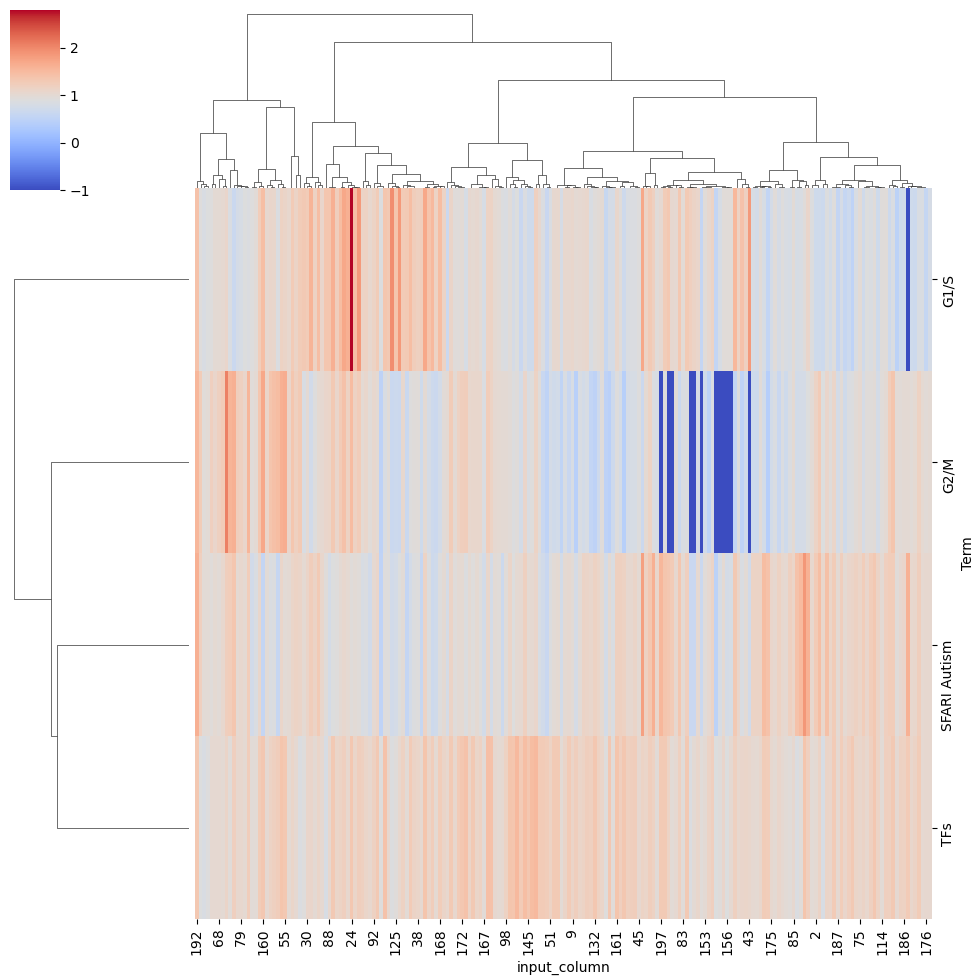

In [57]:
seaborn.clustermap(prerank_out_df.T,col_cluster=True,row_cluster=True,metric='correlation',yticklabels=True,cmap='coolwarm')

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 7.5 mm


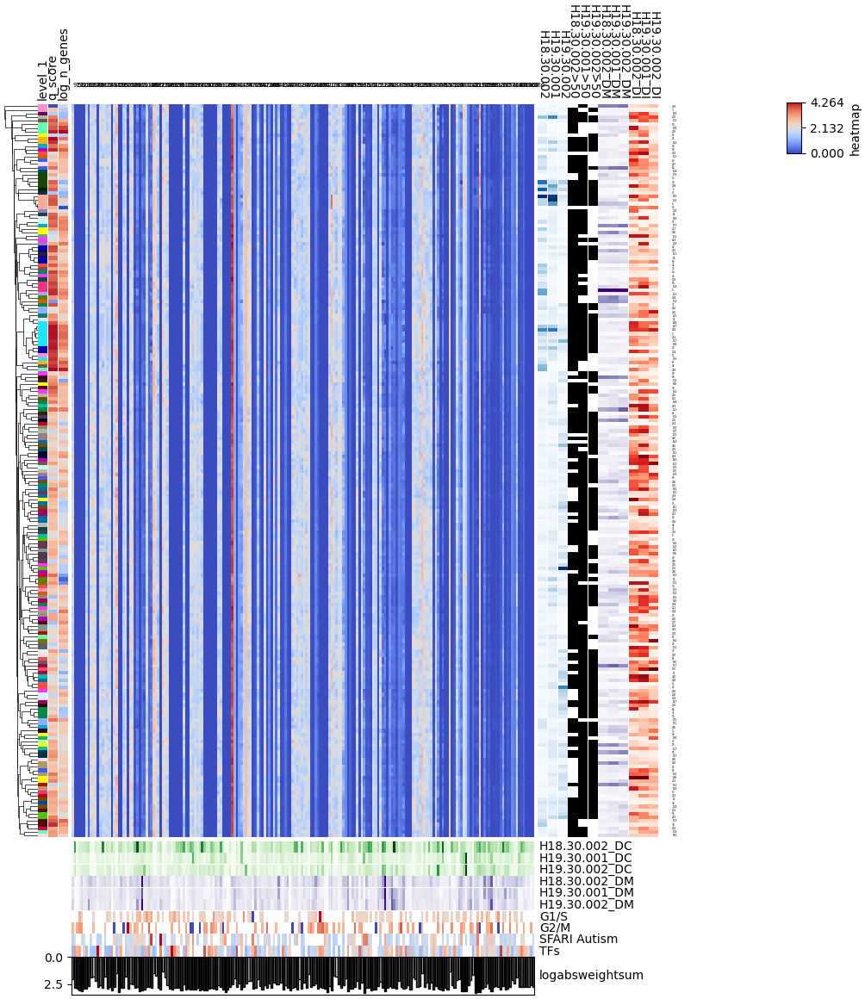

In [59]:
latent_ha_dict={}
breaks=pd.DataFrame({'breaks':[str(int(np.floor(i/20))) for i in range(len(latent_label_order))]},index=latent_label_order)

column_df=dc_df.copy()
column_df.loc[:,prerank_out_df.columns]=prerank_out_df
column_df.loc[:,breaks.columns]=breaks
column_df['index']=column_df.index
column_df=column_df.loc[latent_label_order,:]

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(column_df[col],cmap='Greens',legend=False,rasterized=True)

for col in dmt_df.columns:
    latent_ha_dict[col+'_DM']=pch.anno_simple(dmt_df[col],cmap='Purples',legend=False,rasterized=True)

for k in term_linkage_order:#gl_preranks.keys():
    latent_ha_dict[k]=pch.anno_simple(column_df[k],cmap='coolwarm',legend=False,alpha=(1-prerank_out_pval_df.loc[column_df.index,k]))#vmin=prerank_out_df[k].min(),vmax=column_df[k].max(),

#latent_ha_dict['breaks']=pch.anno_simple(column_df['breaks'])

mat_anno_df=pd.DataFrame(np.log10(1.+np.absolute(pstore['z_decoder_weight']).sum(1)),columns=['logabsweightsum'],index=latent_labels)
column_df['logabsweightsum']=mat_anno_df
latent_ha_dict['logabsweightsum']=pch.anno_barplot(mat_anno_df['logabsweightsum'], cmap='Greys',rasterized=True,legend=False)


top_anno_dict={}
top_anno_dict['label']=pch.anno_label(column_df['index'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-1.,-5.],fontsize=5,arrowprops = dict(visible=False))
top_anno = pch.HeatmapAnnotation(**top_anno_dict,axis=1,orientation='up',plot=False)

bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)

plt.figure(figsize=(10,12))
#.loc[:,latent_label_order]
#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage}, col_split_order="cluster_between_groups",col_split=breaks['breaks']
#loc_df=loc_df.loc[:,latent_label_order].copy()
cm1 = pch.ClusterMapPlotter(data=(loc_df).loc[:,latent_label_order],cmap='coolwarm',row_dendrogram=True,left_annotation=left_ha,top_annotation=top_anno,right_annotation=right_ha,bottom_annotation=bottom_ha,col_cluster=False,rasterized=True)#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage})
#plt.savefig(os.path.join(sc.settings.figdir,'Fig2Clustermap.svg'))
plt.show()

In [107]:
dc_df.idxmax(0)

H18.30.002     83
H19.30.001    152
H19.30.002    152
dtype: object

In [88]:
var_labels[pstore['z_decoder_weight'][2,:].argsort()[:10]]

Index(['LINC02698', 'ASIC2', 'LINC01197', 'ANKRD26P3', 'AC091885.2',
       'KCNH7-AS1', 'ST6GAL2', 'CDH9', 'COL12A1', 'VAV3'],
      dtype='object', name='Gene')

In [110]:
aggr_means=antipode.model_functions.group_aggr_anndata(adata,['donor_id','level_2'],layer='norm_UMIs')

100%|██████████| 609/609 [00:11<00:00, 51.85it/s]


In [111]:
log_aggr_means=np.log(aggr_means[0]+1e-3)

In [133]:
std_log_aggr_means=(log_aggr_means-log_aggr_means.mean(2,keepdims=True))/log_aggr_means.std(2,keepdims=True)

In [118]:
pstore['discov_dc'].var(0).argsort(0)[83,:].shape

(10000,)

In [137]:
np.append(pstore['z_decoder_weight'][83,:].argsort()[0:10],pstore['z_decoder_weight'][83,:].argsort()[-10:])

array([1456, 4360, 5914, 6340,   53, 3645, 2496, 8816, 3644,  106, 1962,
       6651, 3821, 7151, 7870, 7808, 7164, 7301, 6491, 5859])

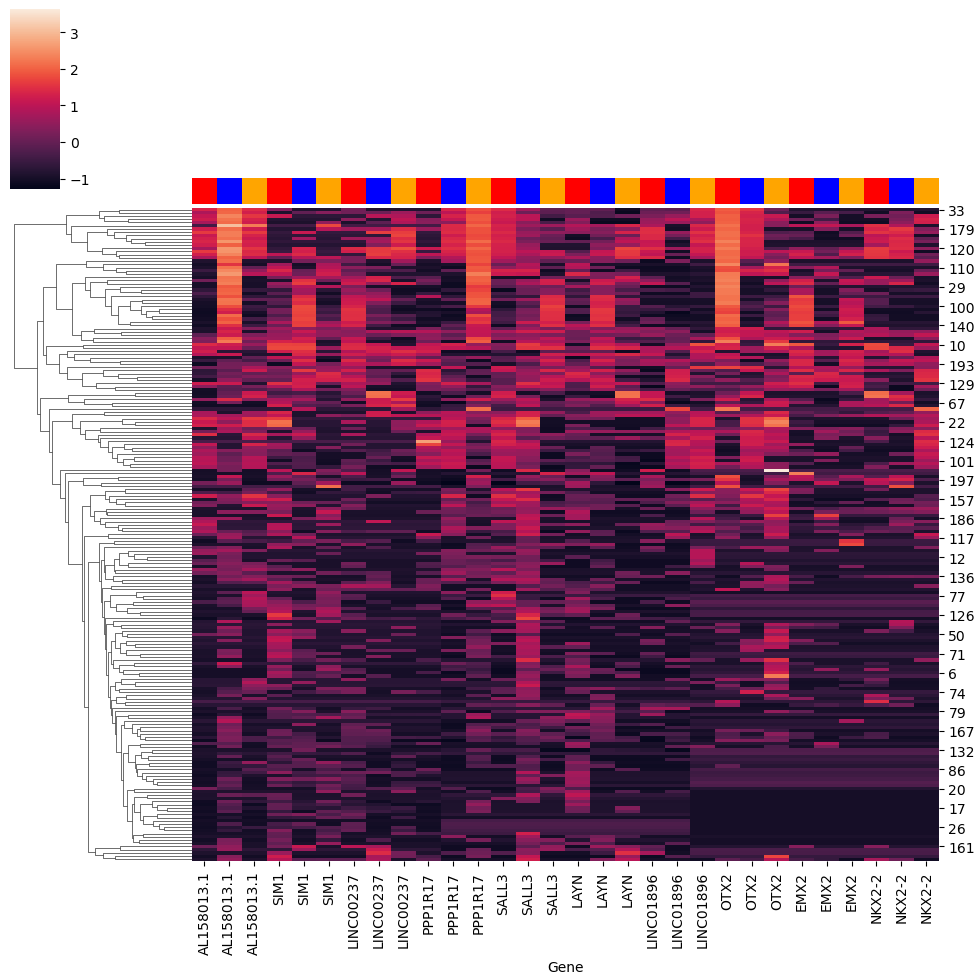

In [153]:
get_dim=89
get_var=np.append(pstore['z_decoder_weight'][get_dim,:].argsort()[0:10],pstore['z_decoder_weight'][get_dim,:].argsort()[-10:])
get_var=pstore['z_decoder_weight'][get_dim,:].argsort()[0:10]
#var_labels[]
select_mat=std_log_aggr_means[:,:,get_var].transpose(1, 0, 2)
seaborn.clustermap(pd.DataFrame(select_mat.reshape(select_mat.shape[0], -1),columns=np.repeat(var_labels[get_var],std_log_aggr_means.shape[0])),col_colors=np.tile(['red','blue','orange'],len(get_var)),col_cluster=False)

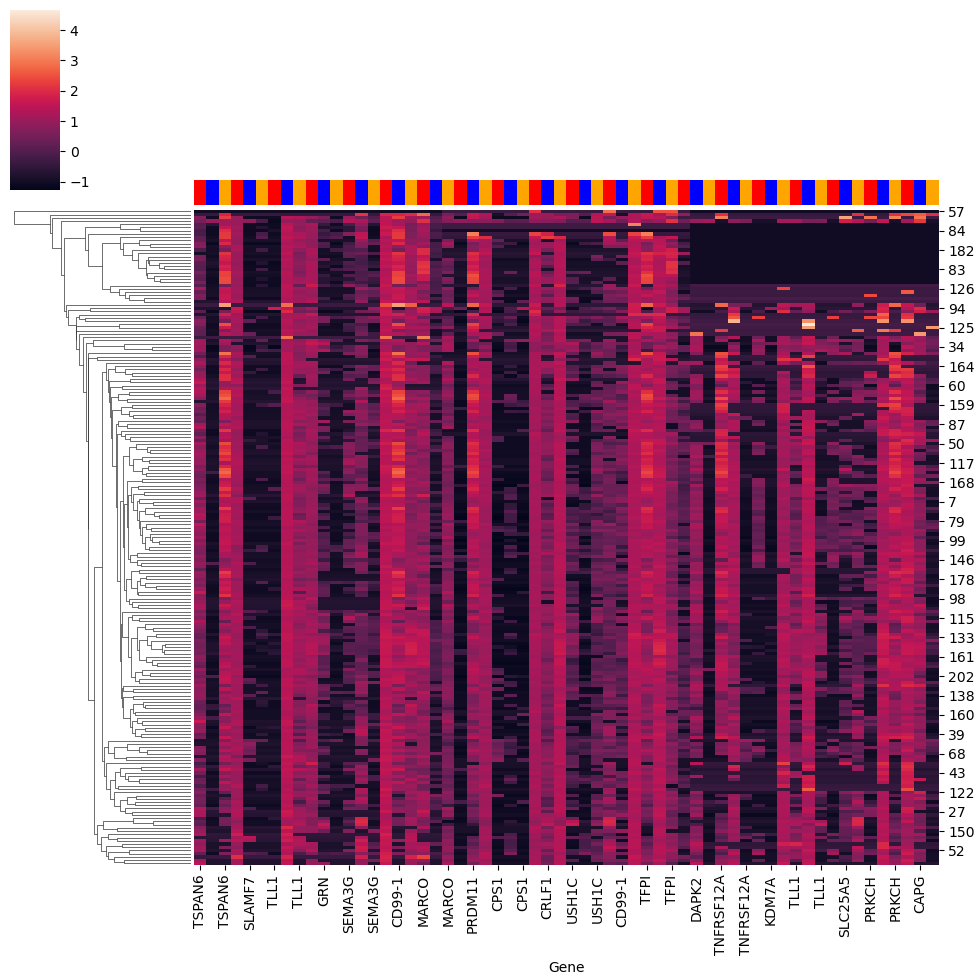

In [138]:
get_var=np.append(pstore['discov_dc'].var(0).argsort(0)[83,:][0:10],pstore['discov_dc'].var(0).argsort(0)[83,:][-10:])
#var_labels[]
select_mat=std_log_aggr_means[:,:,get_var].transpose(1, 0, 2)
seaborn.clustermap(pd.DataFrame(select_mat.reshape(select_mat.shape[0], -1),columns=np.repeat(var_labels[get_var],std_log_aggr_means.shape[0])),col_colors=np.tile(['red','blue','orange'],len(get_var)),col_cluster=False)

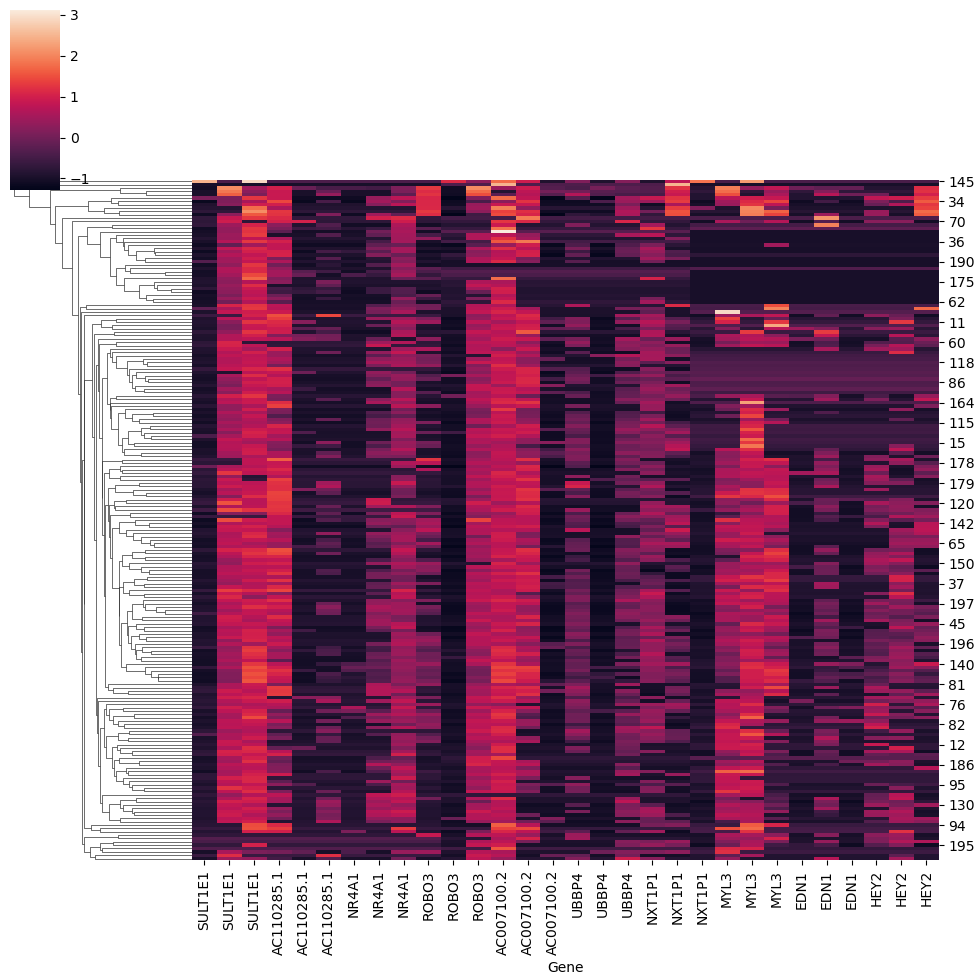

In [148]:
get_var=pstore['z_decoder_weight'][2,:].argsort().argsort()[0:10]#np.append(pstore['z_decoder_weight'][2,:].argsort()[0:10],pstore['z_decoder_weight'][2,:].argsort()[-10:])
#var_labels[]
select_mat=std_log_aggr_means[:,:,get_var].transpose(1, 0, 2)
seaborn.clustermap(pd.DataFrame(select_mat.reshape(select_mat.shape[0], -1),columns=np.repeat(var_labels[get_var],log_aggr_means.shape[0])),col_cluster=False)

In [ ]:
plt.figure(figsize=(8,30))

dtriumat=antipode.plotting.double_triu_mat(np.corrcoef(pstore['z_decoder_weight'][latent_label_order_inds,:]),np.corrcoef(np.absolute(pstore['locs']).T[latent_label_order_inds,:]))
sq_bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down')

cm1 = pch.ClusterMapPlotter(data=pd.DataFrame(dtriumat,index=latent_label_order,columns=latent_label_order),
                            cmap='coolwarm',row_cluster=False,col_cluster=False,bottom_annotation=sq_bottom_ha,top_annotation=top_anno,
                            xlabel_side='top',xlabel='module gene weight corr',ylabel='abs cluster module corr',
                           col_split=20,col_split_gap=20,)
plt.savefig(os.path.join(sc.settings.figdir,'ModuleCorrClustermap.svg'))
plt.show()

In [ ]:
column_df

In [ ]:
seaborn.histplot(pstore['locs'].flatten())

In [ ]:
seaborn.clustermap(np.corrcoef(pstore['cluster_intercept']))

In [ ]:
seaborn.clustermap(np.corrcoef(pstore['z_decoder_weight']))

In [ ]:
"""test_df=pd.DataFrame(np.random.standard_normal([25,10]),columns=[str(x) for x in range(10)],index=['ABAT','ASCL1','FOXP1','FOXP2','FOXP4','FOGX1','DLX2','DLX6','GAD2','NEUROG2','NEUROD6','LMX1A','TH','SOX2','SOX11','SOX17','TBR1','MAP2','SEMA4A', 'SEMA5B', 'SEMA6C', 'SEMA4B', 'SEMA6D', 'SEMA6A', 'SEMA5A'])
bp_list_dict={x:bp_dict[x] for x in bp}
gene_list_dict={'list1':['LMX1A','ABAT','ASCL1','FOXP1','FOXP2','FOXP4','FOGX1','DLX2'],
                'list2':['LMX1A','TH','SOX2','SOX11','SOX17','TBR1','MAP2','SEMA4A', 'SEMA5B', 'SEMA6C', 'SEMA4B', 'SEMA6D', 'SEMA6A', 'SEMA5A'],
                'list6':['LMX1A','TH','SOX2','SOX11','SOX17','TBR1','MAP2','SEMA4A', 'SEMA5B', 'SEMA6C', 'SEMA4B', 'SEMA6D', 'SEMA6A', 'SEMA5A'],
                'list7':['LMX1A','TH','SOX2','SOX11','SOX17','TBR1','MAP2','SEMA4A', 'SEMA5B', 'SEMA6C', 'SEMA4B', 'SEMA6D', 'SEMA6A', 'SEMA5A'],
                'list3':['LMX1A','TH','SOX2','SOX11','SOX17','TBR1','MAP2','SEMA4A', 'SEMA5B', 'SEMA6C', 'SEMA4B', 'SEMA6D', 'SEMA6A', 'SEMA5A']}
warnings.filterwarnings(action='always')
warnings.catch_warnings(action="always")

gene_list_dict['list4']=bp_list_dict[list(bp_list_dict.keys())[0]]
gene_list_dict['list5']=bp_list_dict[list(bp_list_dict.keys())[1]]
df=test_df['0']
df.columns = ['gene_name', 'rank_metric']
pre_res = gseapy.prerank(rnk=df,
                     gene_sets=gene_list_dict, 
                     processes=1,
                     outdir=None,
                     seed=13,min_size=0,max_size=500)
print(pre_res.res2d)
"""

In [ ]:
"""
zdw_mat=pd.DataFrame(np.absolute(pstore['z_decoder_weight']),index=latent_labels,columns=var_labels).T
gl_preranks={}
for k in gene_lists.keys():
    if k not in gl_preranks.keys():
        try:
            gl_preranks[k]=antipode.plotting.get_prerank_from_mat(zdw_mat,list(set(gene_lists[k])),min_size=5,max_size=len(gene_lists[k])+100,permutation_num=1000)
            IPython.display.clear_output(wait=False)
        except Exception as e:
            print('FAIL',k)
            pass

    #except ZeroDivisionError:
    #    break
l=[]
for k in gl_preranks.keys():
    gl_preranks[k]['term']=k
    gl_preranks[k].index=zdw_mat.columns
    l.append(gl_preranks[k].loc[:,['term','NES']])

df=pd.concat(l,axis=0)#
df['index']=df.index
df=df.pivot_table( index='index',columns='term', values='NES', aggfunc='first').astype(float)

"""